# Выпускная квалификационная работа по курсу «Data Science»

В процессе выполнения выпускной квалификационной работы необходимо:
- Изучить теоретические основы и методы решения поставленной задачи
- Провести разведочный анализ предложенных данных. Необходимо нарисовать гистограммы распределения каждой из переменной, диаграммы ящика с усами, попарные графики рассеяния точек. Необходимо также для каждой колонке получить среднее, медианное значение, провести анализ и исключение выбросов, проверить наличие пропусков
- Провести предобработку данных (удаление шумов, нормализация и т.д.)
- Обучить нескольких моделей для прогноза модуля упругости при растяжении и прочности при растяжении. При построении модели необходимо 30% данных оставить на тестирование модели, на остальных происходит обучение моделей. При построении моделей провести поиск гиперпараметров модели с помощью поиска по сетке с перекрестной проверкой, количество блоков равно 10
- Написать нейронную сеть, которая будет рекомендовать соотношение матрица-наполнитель
- Разработать приложение с графическим интерфейсом или интерфейсом командной строки, которое будет выдавать прогноз, полученный в задании 4 или 5 (один или два прогноза, на выбор учащегося)
- Оценить точность модели на тренировочном и тестовом датасете
- Создать репозиторий в GitHub / GitLab и разместить там код исследования. Оформить файл README

### Изучение теоретических основ

> Композиционные материалы — это искусственно созданные материалы, состоящие из нескольких других с четкой границей между ними.
> 
> Композиты обладают теми свойствами, которые не наблюдаются у компонентов по отдельности. При этом композиты являются монолитным материалом, т. е. компоненты материала неотделимы друг от друга без разрушения конструкции в целом.
> 
> Яркий пример композита - железобетон. Бетон прекрасно сопротивляется сжатию, но плохо растяжению. Стальная арматура внутри бетона компенсирует его неспособность сопротивляться сжатию, формируя тем самым новые, уникальные свойства. 
> 
> Современные композиты изготавливаются из других материалов: полимеры, керамика, стеклянные и углеродные волокна, но данный принцип сохраняется. У такого подхода есть и недостаток: даже если мы знаем характеристики исходных компонентов, определить характеристики композита, состоящего из этих компонентов, достаточно проблематично. 
> 
> Для решения этой проблемы есть два пути: физические испытания образцов материалов, или прогнозирование характеристик. Суть прогнозирования заключается в симуляции представительного элемента объема композита, на основе данных о характеристиках входящих компонентов (связующего и армирующего компонента).

### Разведочный анализ данных

> Необходимо нарисовать гистограммы распределения каждой из переменной, диаграммы ящика с усами, попарные графики рассеяния точек.
> 
> Необходимо также по каждой колонке получить среднее, медианное значение, провести анализ и исключение выбросов, проверить наличие пропусков.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('ggplot')
%matplotlib inline
import numpy as np
from sklearn.preprocessing import LabelEncoder
from scipy import stats
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split, cross_validate
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, max_error
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [2]:
# загружаю исходные данные, сразу объединяю в единый датасет
df = pd.read_excel('X_bp.xlsx', index_col=0).join(pd.read_excel('X_nup.xlsx', index_col=0), how='inner')
df.shape

(1023, 13)

In [3]:
df.head(5)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [4]:
# проверяю типы данных
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

In [5]:
# Проверю на пропуски
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

Типы данных корректные, пропусков нет

In [6]:
# вывожу количество уникальных значений в каждом столбце
df.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [7]:
# вывожу описательные статистики
df_d = df.describe().T
df_d.insert(2, 'median', df.median())
df_d

,count,mean,median,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,2.906878,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,1977.621657,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,739.664328,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,110.564840,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,22.230744,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,285.896812,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,451.864365,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,73.268805,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,2459.524526,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,219.198882,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


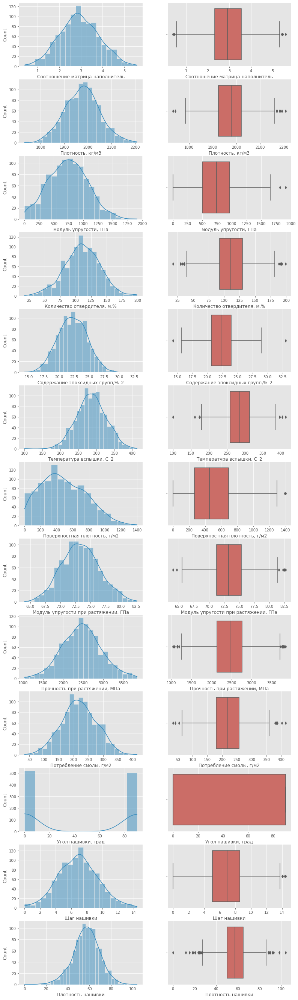

In [8]:
# строю графики
fig, axes = plt.subplots(13, 2, figsize=(13, 48))
for k, column in enumerate(df.columns):    
    sns.histplot(data=df, x=column, kde=True, ax=axes[k, 0], palette='hls')
    sns.boxplot(data=df, x=column, ax=axes[k, 1], palette='hls')
plt.show()

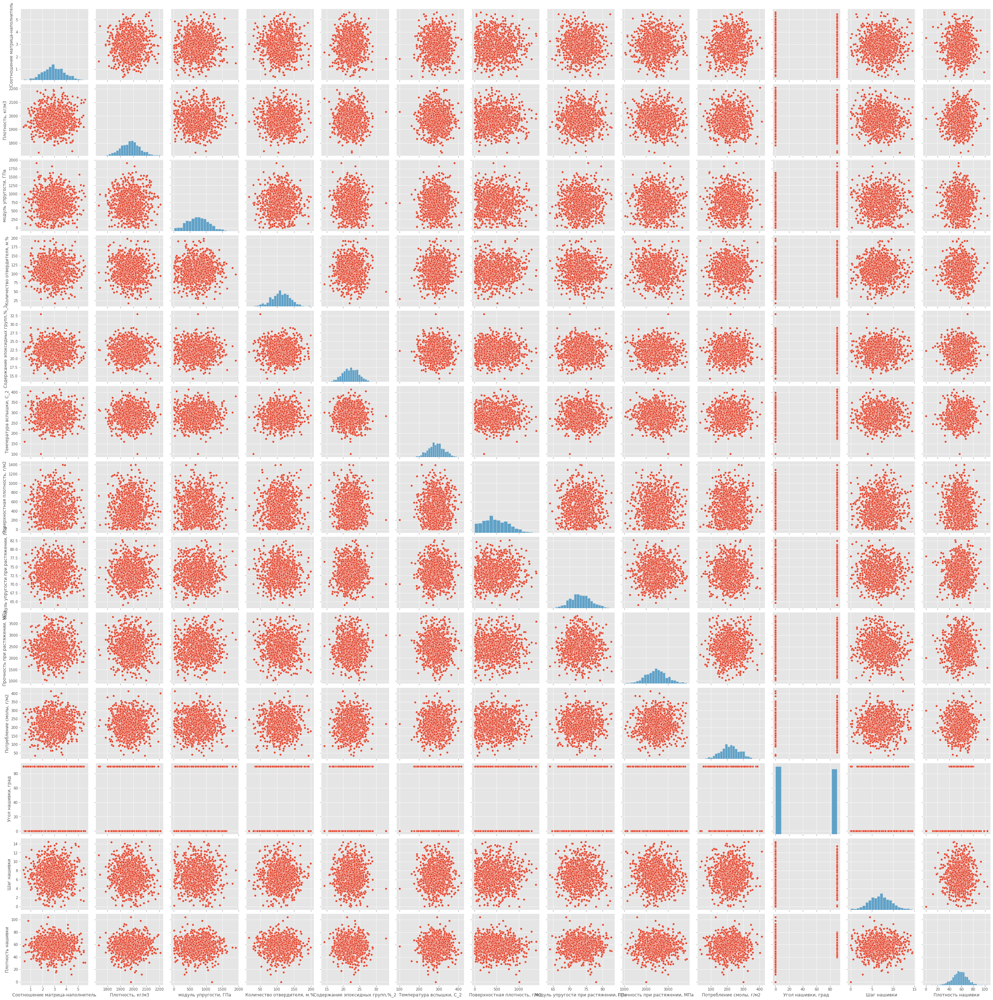

In [9]:
sns.pairplot(df, height=3)

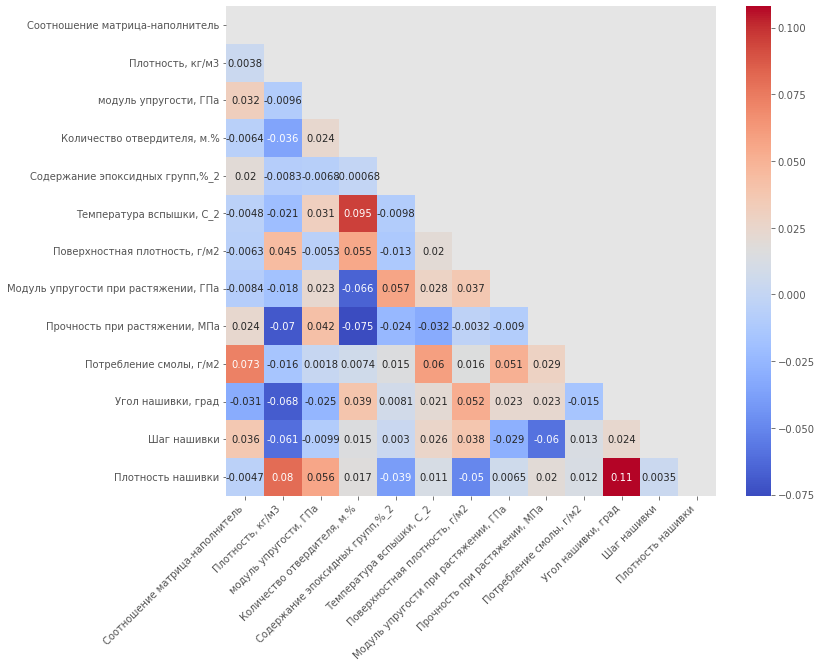

In [10]:
# дополнительно проверим корреляцию
mask = np.triu(df.corr())
f, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(df.corr(), mask=mask, annot=True, square=True, cmap='coolwarm')
plt.xticks(rotation=45, ha='right')
plt.show()

- Визуально все признаки приближены к нормальному распределению, кроме "Угол нашивки, град" - там всего два возможных значения, можно преобразовать в бинарный признак
- Корреляция между признаками отсутствует
- Также видно, что есть выбросы

In [11]:
# преобразуем "Угол нашивки, град"  с помощью функции LabelEncoder
patch_angle = LabelEncoder().fit(df['Угол нашивки, град'])
df['Угол нашивки, град'] = patch_angle.transform(df['Угол нашивки, град'])

Для поиска выбросов расмотрим два варианта: 3-х сигм и межквартильных расстояний.

In [12]:
# для поиска выбросов расмотрим два варианта: 3-х сигм и межквартильных расстояний.
count_3s = 0
count_iq = 0
for column in df:
    d = df.loc[:, [column]]
    # методом 3-х сигм
    zscore = (df[column] - df[column].mean()) / df[column].std()
    d['3s'] = zscore.abs() > 3
    count_3s += d['3s'].sum()
    # методом межквартильных расстояний
    q1 = np.quantile(df[column], 0.25)
    q3 = np.quantile(df[column], 0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    d['iq'] = (df[column] <= lower) | (df[column] >= upper)
    count_iq += d['iq'].sum()

print('Метод 3-х сигм, выбросов:', count_3s)
print('Метод межквартильных расстояний, выбросов:', count_iq)

Метод 3-х сигм, выбросов: 24
Метод межквартильных расстояний, выбросов: 93


Чтобы избежать удаления значимых данных я буду использовать методом 3-х сигм, но сначала проверим распределение выбросов по признакам

In [13]:
t_df = df.copy()
for i in df.columns:
    t_df[i] = abs((df[i] - df[i].mean()) / df[i].std())
    print(f"{sum(t_df[i] > 3)} выбросов в признаке {i}")
print(f' Всего {sum(sum(t_df.values > 3))} выброса')

0 выбросов в признаке Соотношение матрица-наполнитель
3 выбросов в признаке Плотность, кг/м3
2 выбросов в признаке модуль упругости, ГПа
2 выбросов в признаке Количество отвердителя, м.%
2 выбросов в признаке Содержание эпоксидных групп,%_2
3 выбросов в признаке Температура вспышки, С_2
2 выбросов в признаке Поверхностная плотность, г/м2
0 выбросов в признаке Модуль упругости при растяжении, ГПа
0 выбросов в признаке Прочность при растяжении, МПа
3 выбросов в признаке Потребление смолы, г/м2
0 выбросов в признаке Угол нашивки, град
0 выбросов в признаке Шаг нашивки
7 выбросов в признаке Плотность нашивки
 Всего 24 выброса


Выбросы распределены по разным признакам, можем приступать к удалению

In [14]:
clean_df = df[(np.abs(stats.zscore(df)) <= 3).all(axis=1)]
clean_df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
5,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,60.000000
6,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,70.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,1,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,1,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,1,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,1,6.313201,58.261074


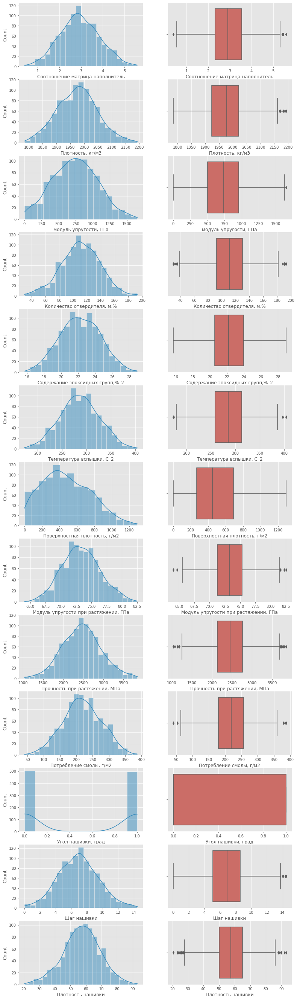

In [15]:
# строю графики повторно
fig, axes = plt.subplots(13, 2, figsize=(13, 48))
for k, column in enumerate(df.columns):    
    sns.histplot(data=clean_df, x=column, kde=True, ax=axes[k, 0], palette='hls')
    sns.boxplot(data=clean_df, x=column, ax=axes[k, 1], palette='hls')
plt.show()

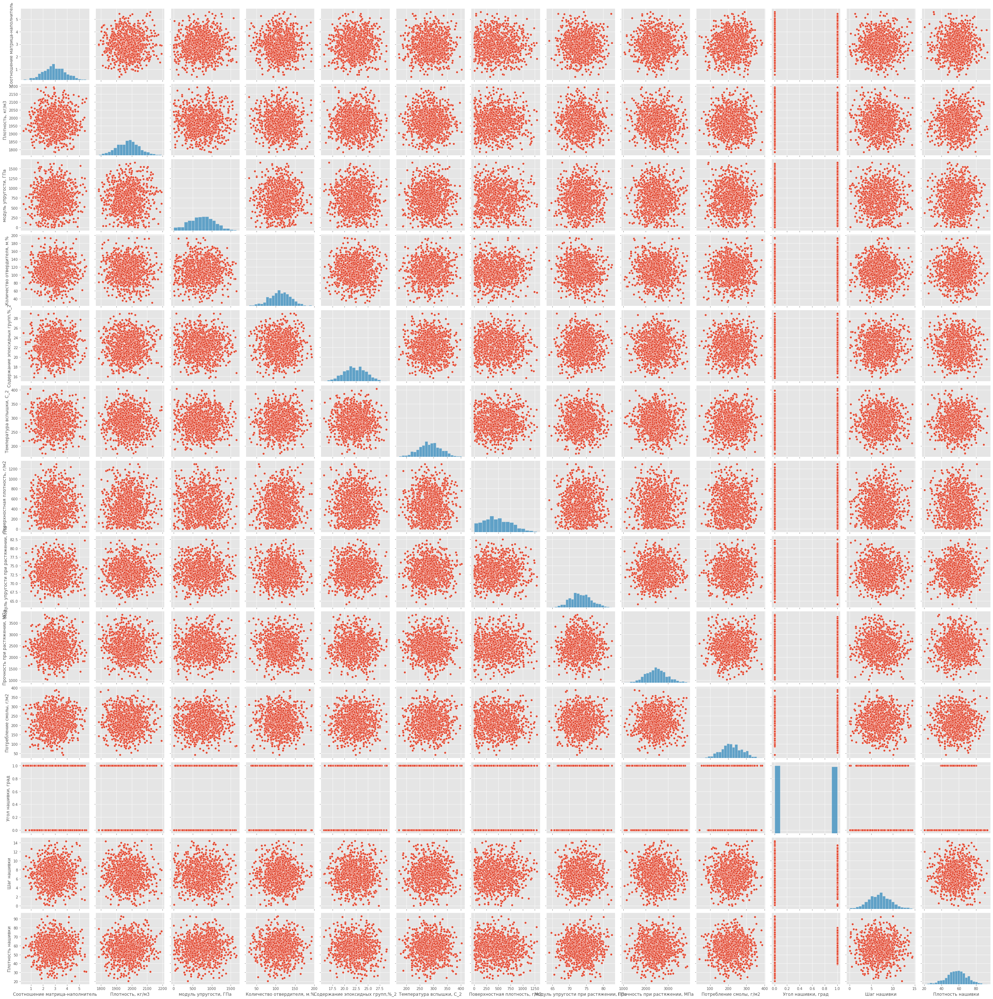

In [16]:
sns.pairplot(clean_df, height=3)

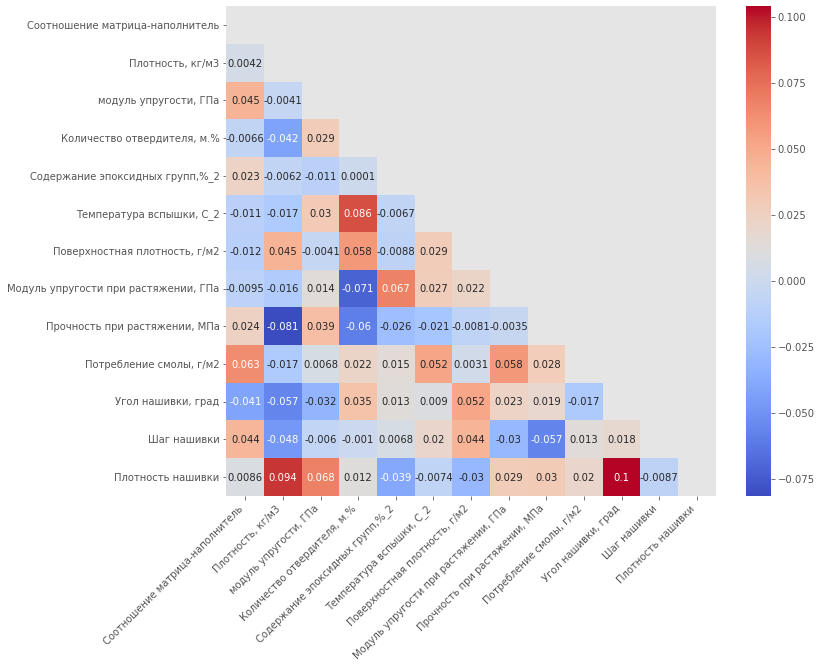

In [17]:
mask = np.triu(clean_df.corr())
f, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(clean_df.corr(), mask=mask, annot=True, square=True, cmap='coolwarm')
plt.xticks(rotation=45, ha='right')
plt.show()

По корреляции изменений нет, выбросы остались только близкие к усам, меня такой результат устраивает

### Предобработка данных

> Выбросы удалены на предыдущем шаге
> 
> Нормализация

<AxesSubplot:ylabel='Density'>

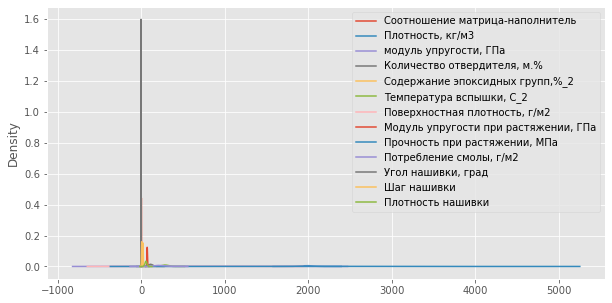

In [18]:
fig, ax = plt.subplots(figsize = (10, 5))
clean_df.plot(kind = 'kde', ax = ax)

Признаки имеют разные диапазоны, что искажает восприятие взаимоотношений между признаками

In [19]:
# нормализуем данные
scaler = MinMaxScaler()
norm_df = pd.DataFrame(scaler.fit_transform(clean_df), columns=clean_df.columns, index=clean_df.index)

<AxesSubplot:ylabel='Density'>

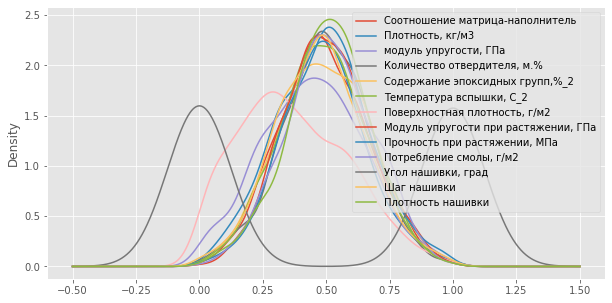

In [20]:
fig, ax = plt.subplots(figsize = (10, 5))
norm_df.plot(kind = 'kde', ax = ax)

In [21]:
norm_df_d = norm_df.describe().T
norm_df_d.insert(2, 'median', norm_df.median())
norm_df_d

,count,mean,median,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,999.0,0.489727,0.484288,0.174701,0.0,0.371306,0.484288,0.608487,1.0
"Плотность, кг/м3",999.0,0.467798,0.472391,0.178722,0.0,0.341020,0.472391,0.579760,1.0
"модуль упругости, ГПа",999.0,0.446887,0.448458,0.198929,0.0,0.302135,0.448458,0.581067,1.0
"Количество отвердителя, м.%",999.0,0.496747,0.495616,0.170875,0.0,0.384427,0.495616,0.613450,1.0
"Содержание эпоксидных групп,%_2",999.0,0.493097,0.492051,0.179869,0.0,0.368588,0.492051,0.624540,1.0
"Температура вспышки, С_2",999.0,0.488685,0.488391,0.174877,0.0,0.371822,0.488391,0.606296,1.0
"Поверхностная плотность, г/м2",999.0,0.371058,0.348503,0.215125,0.0,0.206249,0.348503,0.534748,1.0
"Модуль упругости при растяжении, ГПа",999.0,0.501023,0.496176,0.167891,0.0,0.389296,0.496176,0.610020,1.0
"Прочность при растяжении, МПа",999.0,0.508273,0.504890,0.172193,0.0,0.390683,0.504890,0.613078,1.0
"Потребление смолы, г/м2",999.0,0.512182,0.512933,0.170414,0.0,0.401086,0.512933,0.625356,1.0


### Обучить нескольких моделей для прогноза модуля упругости при растяжении и прочности при растяжении. 

> При построении модели необходимо 30% данных оставить на тестирование модели, на остальных происходит обучение моделей.
> 
> При построении моделей провести поиск гиперпараметров модели с помощью поиска по сетке с перекрестной проверкой, количество блоков равно 10

In [22]:
# разбиваем на тестовую и обучающие выборки
x_upr = norm_df.drop(['Модуль упругости при растяжении, ГПа'], axis=1)
x_pr = norm_df.drop(['Прочность при растяжении, МПа'], axis=1)
y_upr = norm_df[['Модуль упругости при растяжении, ГПа']]
y_pr = norm_df[['Прочность при растяжении, МПа']]

X_train_upr, X_test_upr, y_train_upr, y_test_upr = train_test_split(x_upr, y_upr, test_size=0.3, random_state=1)
X_train_pr, X_test_pr, y_train_pr, y_test_pr = train_test_split(x_pr, y_pr, test_size=0.3, random_state=1)

In [23]:
models = pd.DataFrame()

**Линейная регрессия**

In [24]:
LR = LinearRegression()
LR_params = {
    'fit_intercept' : ['True', 'False']
}

*Целевой параметр - модуль упругости при растяжении*

In [25]:
GSCV_LR_upr = GridSearchCV(LR, LR_params, n_jobs=-1, cv=10)
GSCV_LR_upr.fit(X_train_upr, y_train_upr)
GSCV_LR_upr.best_params_

{'fit_intercept': 'True'}

In [26]:
LR_upr = GSCV_LR_upr.best_estimator_
print(f'R2-score LinearRegression для модуля упругости при растяжении: {LR_upr.score(X_test_upr, y_test_upr).round(4)}')

R2-score LinearRegression для модуля упругости при растяжении: -0.0004


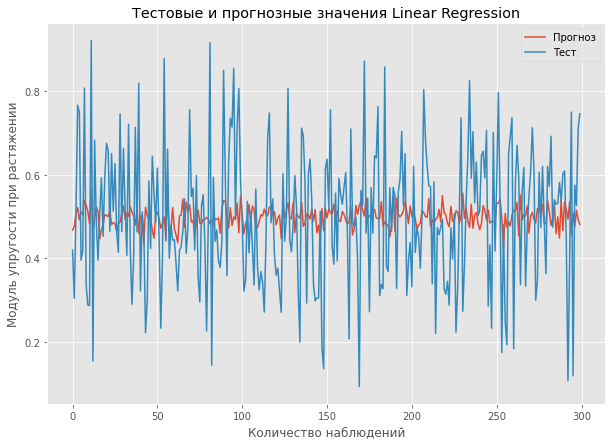

In [27]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Linear Regression")
plt.plot(LR_upr.predict(X_test_upr), label = "Прогноз")
plt.plot(y_test_upr.values, label = "Тест")
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении")
plt.legend()
plt.grid(True)

In [28]:
LR_upr_result = pd.DataFrame({
   'Model': 'LinearRegression', 
   'MAE': mean_absolute_error(y_test_upr, LR_upr.predict(X_test_upr).round(4)), 
   'R2 score': LR_upr.score(X_test_upr, y_test_upr).round(4)},
    index=['Модуль упругости при растяжении'])

models = pd.concat([models, LR_upr_result])

*Целевой параметр - прочность при растяжении*

In [29]:
GSCV_LR_pr = GridSearchCV(LR, LR_params, n_jobs=-1, cv=10)
GSCV_LR_pr.fit(X_train_pr, y_train_pr)
GSCV_LR_pr.best_params_

{'fit_intercept': 'True'}

In [30]:
LR_pr = GSCV_LR_pr.best_estimator_
print(f'R2-score LinearRegression для прочности при растяжении: {LR_pr.score(X_test_pr, y_test_pr).round(4)}')

R2-score LinearRegression для прочности при растяжении: -0.0247


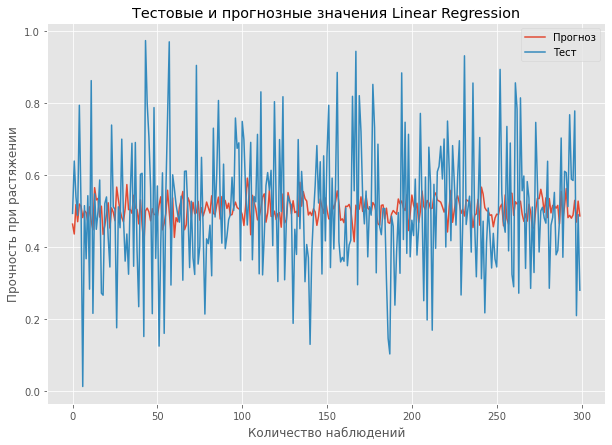

In [31]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Linear Regression")
plt.plot(LR_pr.predict(X_test_pr), label = "Прогноз")
plt.plot(y_test_pr.values, label = "Тест")
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении")
plt.legend()
plt.grid(True)

In [32]:
LR_pr_result = pd.DataFrame({
   'Model': 'LinearRegression', 
   'MAE': mean_absolute_error(y_test_pr, LR_pr.predict(X_test_pr).round(4)), 
   'R2 score': LR_pr.score(X_test_pr, y_test_pr).round(4)},
    index=['Прочность при растяжении'])

models = pd.concat([models, LR_pr_result])
models

,Model,MAE,R2 score
Модуль упругости при растяжении,LinearRegression,0.131346,-0.0004
Прочность при растяжении,LinearRegression,0.141692,-0.0247


**Метод K-ближайших соседей**

In [33]:
KNR = KNeighborsRegressor()
KNR_params = {'n_neighbors' : range(1, 301, 2), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }

*Целевой параметр - модуль упругости при растяжении*

In [34]:
GSCV_KNR_upr = GridSearchCV(KNR, KNR_params, n_jobs=-1, cv=10)
GSCV_KNR_upr.fit(X_train_upr, y_train_upr)
GSCV_KNR_upr.best_params_

{'algorithm': 'auto', 'n_neighbors': 119, 'weights': 'uniform'}

In [35]:
KNR_upr = GSCV_KNR_upr.best_estimator_
print(f'R2-score KNR для модуля упругости при растяжении: {KNR_upr.score(X_test_upr, y_test_upr).round(4)}')

R2-score KNR для модуля упругости при растяжении: 0.0019


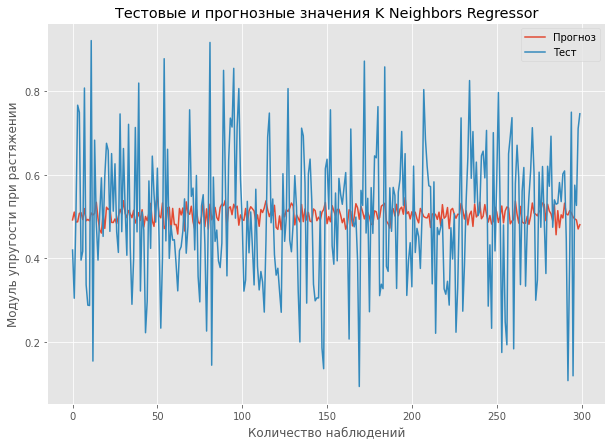

In [36]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения K Neighbors Regressor")
plt.plot(KNR_upr.predict(X_test_upr), label = "Прогноз")
plt.plot(y_test_upr.values, label = "Тест")
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении")
plt.legend()
plt.grid(True)

In [37]:
KNR_upr_result = pd.DataFrame({
   'Model': 'KNeighborsRegressor', 
   'MAE': mean_absolute_error(y_test_upr, KNR_upr.predict(X_test_upr).round(4)), 
   'R2 score': KNR_upr.score(X_test_upr, y_test_upr).round(4)},
    index=['Модуль упругости при растяжении'])

models = pd.concat([models, KNR_upr_result])

*Целевой параметр - прочность при растяжении*

In [38]:
GSCV_KNR_pr = GridSearchCV(KNR, KNR_params, n_jobs=-1, cv=10)
GSCV_KNR_pr.fit(X_train_pr, y_train_pr)
GSCV_KNR_pr.best_params_

{'algorithm': 'auto', 'n_neighbors': 231, 'weights': 'distance'}

In [39]:
KNR_pr = GSCV_KNR_pr.best_estimator_
print(f'R2-score KNR для прочности при растяжении: {KNR_pr.score(X_test_pr, y_test_pr).round(4)}')

R2-score KNR для прочности при растяжении: -0.0004


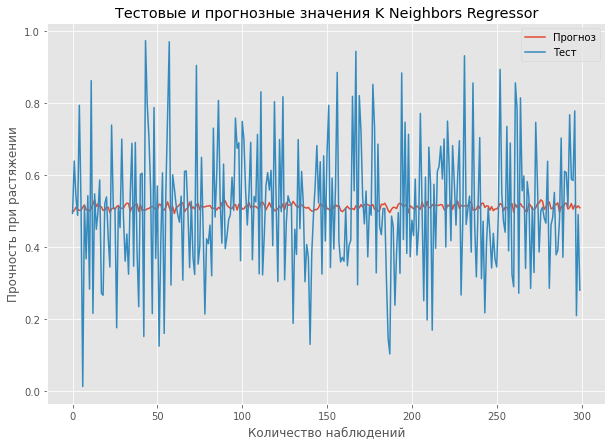

In [40]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения K Neighbors Regressor")
plt.plot(KNR_pr.predict(X_test_pr), label = "Прогноз")
plt.plot(y_test_pr.values, label = "Тест")
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении")
plt.legend()
plt.grid(True)

In [41]:
KNR_pr_result = pd.DataFrame({
   'Model': 'KNeighborsRegressor', 
   'MAE': mean_absolute_error(y_test_pr, KNR_pr.predict(X_test_pr).round(4)), 
   'R2 score': KNR_pr.score(X_test_pr, y_test_pr).round(4)},
    index=['Прочность при растяжении'])

models = pd.concat([models, KNR_pr_result])
models

,Model,MAE,R2 score
Модуль упругости при растяжении,LinearRegression,0.131346,-0.0004
Прочность при растяжении,LinearRegression,0.141692,-0.0247
Модуль упругости при растяжении,KNeighborsRegressor,0.131368,0.0019
Прочность при растяжении,KNeighborsRegressor,0.138464,-0.0004


**Случайный лес**

In [42]:
RFR = RandomForestRegressor()
RFR_params = {
    'n_estimators' : range(10, 1000, 10),
    'criterion' : ['squared_error', 'absolute_error', 'poisson'],
    'max_depth' : range(1, 7),
    'min_samples_split' : range(20, 50, 5),
    'min_samples_leaf' : range(2, 8),
    'bootstrap' : ['True', 'False']
}

*Целевой параметр - модуль упругости при растяжении*

In [43]:
RSCV_RFR_upr = RandomizedSearchCV(RFR, RFR_params, n_jobs=-1, cv=10, verbose=4)
RSCV_RFR_upr.fit(X_train_upr, np.ravel(y_train_upr))
RSCV_RFR_upr.best_params_

Fitting 10 folds for each of 10 candidates, totalling 100 fits


{'n_estimators': 920,
 'min_samples_split': 20,
 'min_samples_leaf': 3,
 'max_depth': 4,
 'criterion': 'poisson',
 'bootstrap': 'True'}

In [44]:
RFR_upr = RSCV_RFR_upr.best_estimator_
print(f'R2-score RFR для модуля упругости при растяжении: {RFR_upr.score(X_test_upr, y_test_upr).round(4)}')

R2-score RFR для модуля упругости при растяжении: -0.0074


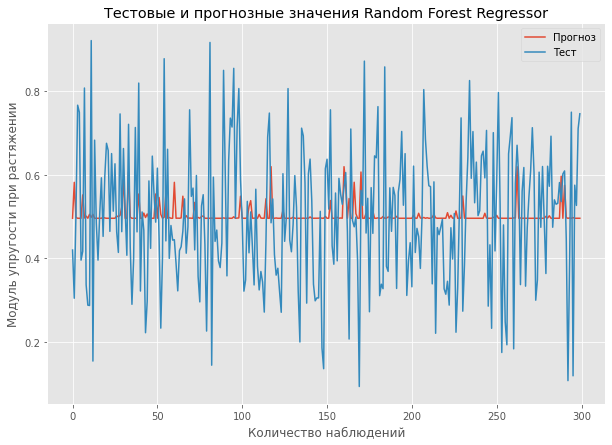

In [45]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Random Forest Regressor")
plt.plot(RFR_upr.predict(X_test_upr), label = "Прогноз")
plt.plot(y_test_upr.values, label = "Тест")
plt.xlabel("Количество наблюдений")
plt.ylabel("Модуль упругости при растяжении")
plt.legend()
plt.grid(True)

In [46]:
RFR_upr_result = pd.DataFrame({
   'Model': 'RandomForestRegressor_upr', 
   'MAE': mean_absolute_error(y_test_upr, RFR_upr.predict(X_test_upr).round(4)), 
   'R2 score': RFR_upr.score(X_test_upr, y_test_upr).round(4)
}, index=['Модуль упругости при растяжении'])

models = pd.concat([models, RFR_upr_result])

*Целевой параметр - прочность при растяжении*

In [47]:
RSCV_RFR_pr = RandomizedSearchCV(RFR, RFR_params, n_jobs=-1, cv=10, verbose=4)
RSCV_RFR_pr.fit(X_train_pr, np.ravel(y_train_pr))
RSCV_RFR_pr.best_params_

Fitting 10 folds for each of 10 candidates, totalling 100 fits


{'n_estimators': 630,
 'min_samples_split': 40,
 'min_samples_leaf': 7,
 'max_depth': 3,
 'criterion': 'squared_error',
 'bootstrap': 'True'}

In [48]:
RFR_pr = RSCV_RFR_pr.best_estimator_
print(f'R2-score RFR для прочности при растяжении: {RFR_pr.score(X_test_pr, y_test_pr).round(4)}')

R2-score RFR для прочности при растяжении: -0.0075


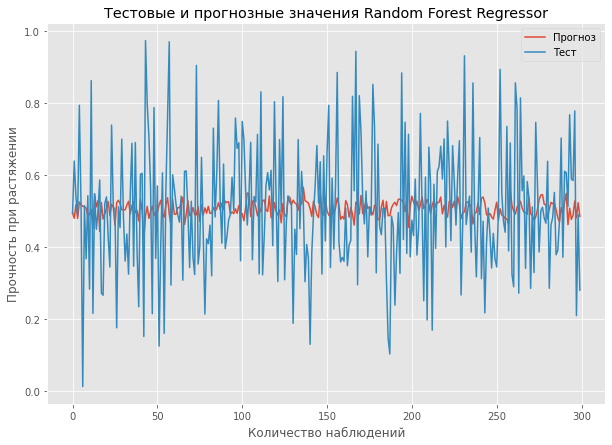

In [49]:
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Random Forest Regressor")
plt.plot(RFR_pr.predict(X_test_pr), label = "Прогноз")
plt.plot(y_test_pr.values, label = "Тест")
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении")
plt.legend()
plt.grid(True)

In [50]:
RFR_pr_result = pd.DataFrame({
   'Model': 'RandomForestRegressor_pr', 
   'MAE': mean_absolute_error(y_test_pr, RFR_pr.predict(X_test_pr).round(4)), 
   'R2 score': RFR_pr.score(X_test_pr, y_test_pr).round(4)
}, index=['Прочность при растяжении'])

models = pd.concat([models, RFR_pr_result])
models

,Model,MAE,R2 score
Модуль упругости при растяжении,LinearRegression,0.131346,-0.0004
Прочность при растяжении,LinearRegression,0.141692,-0.0247
Модуль упругости при растяжении,KNeighborsRegressor,0.131368,0.0019
Прочность при растяжении,KNeighborsRegressor,0.138464,-0.0004
Модуль упругости при растяжении,RandomForestRegressor_upr,0.132014,-0.0074
Прочность при растяжении,RandomForestRegressor_pr,0.139252,-0.0075


Text(0.5, 1.0, 'Средняя абсолютная ошибка МАЕ моделей прогноза для модуля упругости при растяжении')

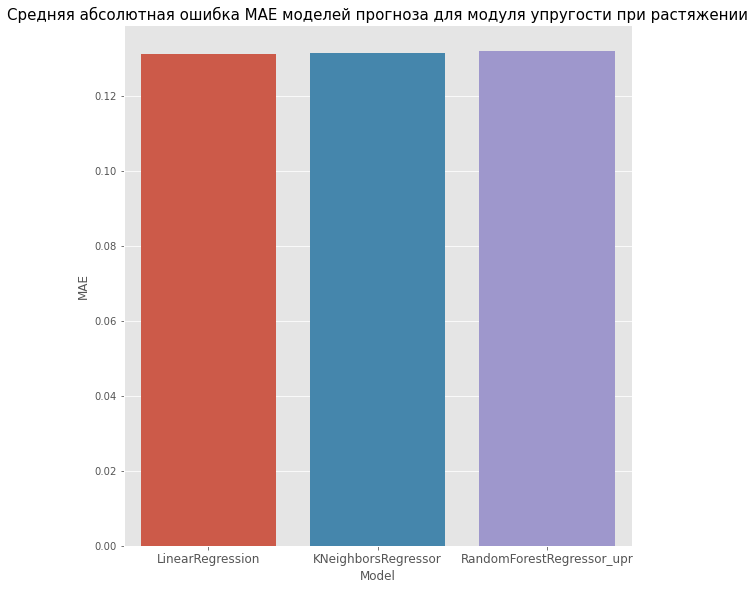

In [51]:
sns.catplot(data=models.iloc[[0, 2, 4]], x='Model', y='MAE', kind='bar', height=8, aspect=1)
plt.xticks(size=12)
plt.title('Средняя абсолютная ошибка МАЕ моделей прогноза для модуля упругости при растяжении', size=15)

Text(0.5, 1.0, 'Средняя абсолютная ошибка МАЕ моделей прогноза для модуля упругости при растяжении')

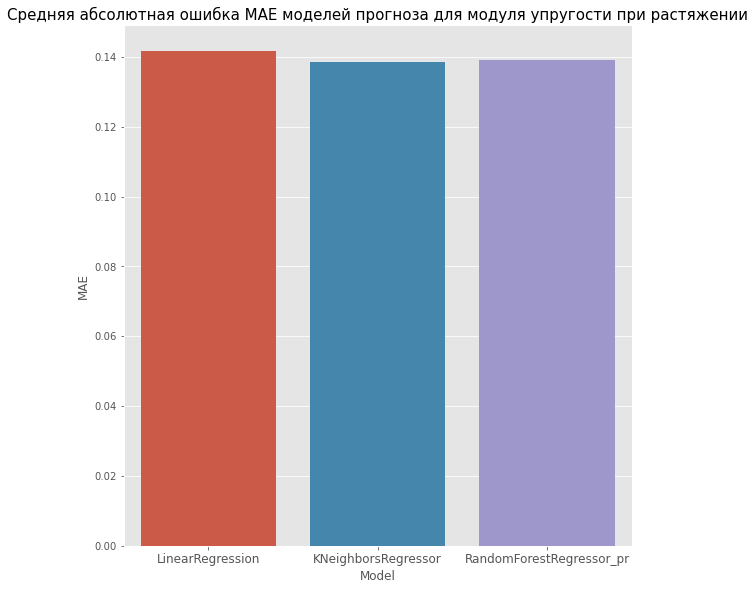

In [52]:
sns.catplot(data=models.iloc[[1, 3, 5]], x='Model', y='MAE', kind='bar', height=8, aspect=1)
plt.xticks(size=12)
plt.title('Средняя абсолютная ошибка МАЕ моделей прогноза для модуля упругости при растяжении', size=15)

### Написать нейронную сеть, которая будет рекомендовать соотношение матрица-наполнитель

In [53]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential, utils, layers
from tensorflow.keras.layers import Dense, BatchNormalization, LeakyReLU, Activation, Dropout, LSTM
import tensorflow.python.keras.optimizers

In [54]:
# разбиваем на тестовую и обучающие выборки (работаем с датасетом, который ранее был очищен от выбросов)
x = clean_df.drop(['Соотношение матрица-наполнитель'], axis=1)
y = clean_df[['Соотношение матрица-наполнитель']]

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=1)
normalizer = tf.keras.layers.Normalization(axis=-1)
X_train_norm = normalizer.adapt(np.array(X_train))

In [55]:
model = Sequential(X_train_norm)
model.add(Dense(128))
model.add(BatchNormalization())
model.add(LeakyReLU())
model.add(Dense(128, activation='selu'))
model.add(BatchNormalization())
model.add(Dense(64, activation='selu'))
model.add(BatchNormalization())
model.add(Dense(32, activation='selu'))
model.add(BatchNormalization())
model.add(LeakyReLU())
model.add(Dense(16, activation='selu'))
model.add(BatchNormalization())
model.add(Dense(1))
model.add(Activation('selu'))

model.compile(loss = 'mean_absolute_error', optimizer=tf.optimizers.SGD(learning_rate=0.01))

In [56]:
history = model.fit(X_train, y_train, batch_size = 32, epochs = 100, validation_data = (X_train, y_train), verbose = 1, validation_split = 0.2)

Epoch 1/100
22/22 [==============================] - 2s 12ms/step - loss: 2.4302 - val_loss: 4.2020
Epoch 2/100
22/22 [==============================] - 0s 3ms/step - loss: 2.0631 - val_loss: 3.2690
Epoch 3/100
22/22 [==============================] - 0s 3ms/step - loss: 1.8531 - val_loss: 3.6227
Epoch 4/100
22/22 [==============================] - 0s 3ms/step - loss: 1.7572 - val_loss: 2.9262
Epoch 5/100
22/22 [==============================] - 0s 3ms/step - loss: 1.6028 - val_loss: 1.9379
Epoch 6/100
22/22 [==============================] - 0s 3ms/step - loss: 1.5131 - val_loss: 1.2670
Epoch 7/100
22/22 [==============================] - 0s 3ms/step - loss: 1.3337 - val_loss: 1.5368
Epoch 8/100
22/22 [==============================] - 0s 3ms/step - loss: 1.1278 - val_loss: 0.9665
Epoch 9/100
22/22 [==============================] - 0s 3ms/step - loss: 0.8639 - val_loss: 1.3978
Epoch 10/100
22/22 [==============================] - 0s 3ms/step - loss: 0.7789 - val_loss: 1.0078
Epoch 11

22/22 [==============================] - 0s 3ms/step - loss: 0.6562 - val_loss: 0.7269
Epoch 84/100
22/22 [==============================] - 0s 3ms/step - loss: 0.6621 - val_loss: 0.6520
Epoch 85/100
22/22 [==============================] - 0s 3ms/step - loss: 0.6595 - val_loss: 0.6510
Epoch 86/100
22/22 [==============================] - 0s 3ms/step - loss: 0.6467 - val_loss: 0.6527
Epoch 87/100
22/22 [==============================] - 0s 3ms/step - loss: 0.6602 - val_loss: 0.7760
Epoch 88/100
22/22 [==============================] - 0s 3ms/step - loss: 0.6500 - val_loss: 0.6657
Epoch 89/100
22/22 [==============================] - 0s 3ms/step - loss: 0.6539 - val_loss: 0.7175
Epoch 90/100
22/22 [==============================] - 0s 3ms/step - loss: 0.6658 - val_loss: 0.6492
Epoch 91/100
22/22 [==============================] - 0s 3ms/step - loss: 0.6690 - val_loss: 0.6520
Epoch 92/100
22/22 [==============================] - 0s 3ms/step - loss: 0.6559 - val_loss: 0.6757
Epoch 93/100


In [57]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               1664      
                                                                 
 batch_normalization (BatchN  (None, 128)              512       
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 128)               16512     
                                                                 
 batch_normalization_1 (Batc  (None, 128)              512       
 hNormalization)                                                 
                                                                 
 dense_2 (Dense)             (None, 64)                8

### Оценить точность модели на тренировочном и тестовом датасете

10/10 [==============================] - 0s 1ms/step


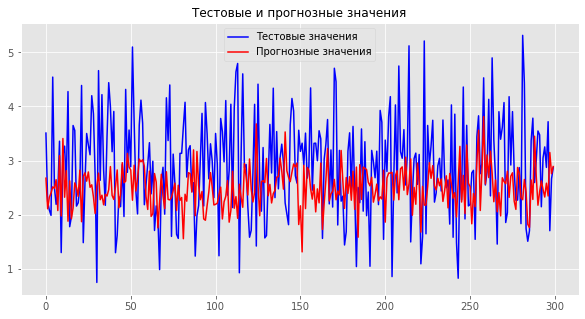

In [58]:
y_pred=model.predict(np.array(X_test))

plt.figure(figsize=(10,5))
plt.title('Тестовые и прогнозные значения', size=12)
plt.plot(y_test.values, color='blue', label = 'Тестовые значения')
plt.plot(y_pred, color='red', label = 'Прогнозные значения')
plt.legend(loc='best')
plt.show()

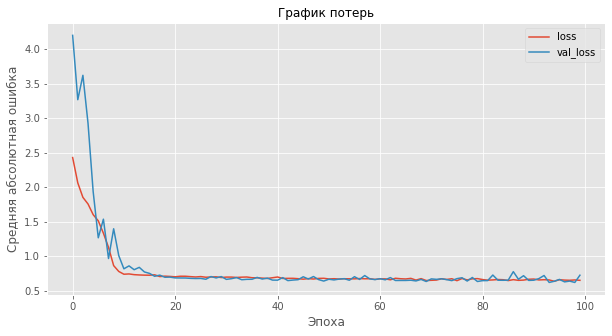

In [59]:
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('График потерь', size=12)
plt.ylabel('Средняя абсолютная ошибка', size=12)
plt.xlabel('Эпоха', size=12)
plt.legend(['loss', 'val_loss'], loc='best')
plt.show()

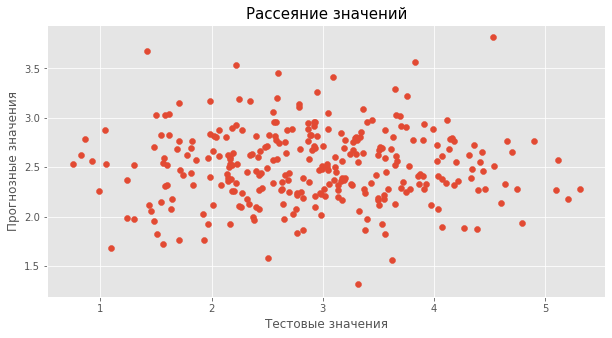

In [60]:
plt.figure(figsize=(10,5))
plt.title('Рассеяние значений', size=15)
plt.scatter(y_test.values, y_pred)
plt.xlabel('Тестовые значения', size=12)
plt.ylabel('Прогнозные значения', size=12)
plt.show()

In [61]:
mae_nn = mean_absolute_error(y_test, y_pred)
print('MAE:',mae_nn)

MAE: 0.853286393990804


In [62]:
model.save('app/model')

INFO:tensorflow:Assets written to: app/model\assets


INFO:tensorflow:Assets written to: app/model\assets


In [63]:
def input_variable():
    x1 = float(input('Введите значение переменной Плотность, кг/м3: '))
    x2 = float(input('Введите значение переменной Модуль упругости, ГПа: '))
    x3 = float(input('Введите значение переменной Количество отвердителя, м.%: '))
    x4 = float(input('Введите значение переменной Содержание эпоксидных групп,%_2: '))
    x5 = float(input('Введите значение переменной Температура вспышки, С_2: '))
    x6 = float(input('Введите значение переменной Поверхностная плотность, г/м2: '))
    x7 = float(input('Введите значение переменной Модуль упругости при растяжении, ГПа: '))
    x8 = float(input('Введите значение переменной Прочность при растяжении, МПа: '))
    x9 = float(input('Введите значение переменной Потребление смолы, г/м2: '))
    x10 = float(input('Введите значение переменной Угол нашивки: '))
    x11 = float(input('Введите значение переменной Шаг нашивки: '))
    x12 = float(input('Введите значение переменной Плотность нашивки: '))
    return x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12

def input_proc(X):

    loaded_model = tf.keras.models.load_model('app/model')
    res = model.predict(X)
    return res 

def app_model():
  
    print('Приложение прогнозирует соотношение матрица-наполнитель')
    for i in range(110):
        try:
            print('Введите "1" для прогноза, "2" для выхода')
            check = input()
      
            if check == '1':
                print('Введите данные')
                X = input_variable()
                # X =  scaler_x.transform(np.array(X).reshape(1,-1))
                print(['Соотношение матрица-наполнитель'])
                print(input_proc(np.array(X).reshape(1,-1)))
                # print(scaler_y.inverse_transform(input_proc(X)))

            elif check == '2':
                break
            else:
                print('Повторите выбор')
        except Exception as e:
            print(e)
            print('Неверные данные. Повторите операцию')
app_model()

Приложение прогнозирует соотношение матрица-наполнитель
Введите "1" для прогноза, "2" для выхода
1
Введите данные
Введите значение переменной Плотность, кг/м3: 1
Введите значение переменной Модуль упругости, ГПа: 2
Введите значение переменной Количество отвердителя, м.%: 3
Введите значение переменной Содержание эпоксидных групп,%_2: 4
Введите значение переменной Температура вспышки, С_2: 5
Введите значение переменной Поверхностная плотность, г/м2: 6
Введите значение переменной Модуль упругости при растяжении, ГПа: 7
Введите значение переменной Прочность при растяжении, МПа: 8
Введите значение переменной Потребление смолы, г/м2: 9
Введите значение переменной Угол нашивки: 10
Введите значение переменной Шаг нашивки: 11
Введите значение переменной Плотность нашивки: 12
['Соотношение матрица-наполнитель']
1/1 [==============================] - 0s 17ms/step
[[4.554541]]
Введите "1" для прогноза, "2" для выхода
1
Введите данные
Введите значение переменной Плотность, кг/м3: 2
Введите значение